In [28]:
# Summary statistics and visuals for Neurofinder training datasets.
%load_ext autoreload
%autoreload 2
%matplotlib inline
from __future__ import print_function
from glob import glob
from pprint import pprint
import json
import matplotlib.pyplot as plt
import pandas as pd
import sys; sys.path.append('..')

from deepcalcium.datasets.nf import nf_load_hdf5
from deepcalcium.utils.visuals import mask_outlines

DATASETS_DIR = '/home/kzh/.deep-calcium-datasets/'
print('Done')

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
Done


In [11]:
# Import datasets as HDF5 files. This will also download and unzip
# the datasets if they are not already on the machine.
S, M = nf_load_hdf5('all_train', datasets_dir=DATASETS_DIR)
for s, m in zip(S, M):
    name = s.attrs['name']
    nb_images = s.get('s').shape[0]
    nb_neurons = m.get('m').shape[0]
    resolution = str(s.get('s').shape[1:])
    print('%s: %d images, %d neurons, %s resolution' % (name, nb_images, nb_neurons, resolution))
    s.close(); m.close()
print('Done')

neurofinder.00.00: 3024 images, 330 neurons, (512, 512) resolution
neurofinder.00.01: 3048 images, 317 neurons, (512, 512) resolution
neurofinder.00.02: 3080 images, 352 neurons, (512, 512) resolution
neurofinder.00.03: 3052 images, 340 neurons, (512, 512) resolution
neurofinder.00.04: 3137 images, 445 neurons, (512, 512) resolution
neurofinder.00.05: 3755 images, 499 neurons, (512, 512) resolution
neurofinder.00.06: 3107 images, 439 neurons, (512, 512) resolution
neurofinder.00.07: 3110 images, 379 neurons, (512, 512) resolution
neurofinder.00.08: 3336 images, 460 neurons, (512, 512) resolution
neurofinder.00.09: 3027 images, 465 neurons, (512, 512) resolution
neurofinder.00.10: 2908 images, 415 neurons, (512, 512) resolution
neurofinder.00.11: 3108 images, 353 neurons, (512, 512) resolution
neurofinder.01.00: 2250 images, 345 neurons, (512, 512) resolution
neurofinder.01.01: 1825 images, 350 neurons, (512, 512) resolution
neurofinder.02.00: 8000 images, 197 neurons, (512, 512) resolu

In [24]:
# Info.json file for each dataset.
info_fnames = sorted(glob('%s/neurofinder*/info.json' % DATASETS_DIR))
rows = []
for fname in info_fnames:
    name = fname.split('/')[-2]
    f = open(fname, 'r'); info = json.load(f); f.close()
    cols = ['name'] + sorted(info.keys())
    vals = [name] + [str(info[k]) for k in sorted(info.keys())]
    rows.append(vals)

df = pd.DataFrame(rows, columns=cols)
df

,name,animal,animal-state,contributors,depth-microns,dimensions,experiment,id,indicator,lab,location,method,pixels-per-micron,rate-hz,region
0,neurofinder.00.00.test,Mouse,Awake head-fixed,[u'Simon Peron'],144,"[512, 512, 3068]",Two alternative forced choice pole detection,an229717_2013_12_02_fov_03002,GCaMP6s,Svoboda Lab,Janelia Research Campus,Two-photon raster,1.15,7,vS1
1,neurofinder.00.00,Mouse,Awake head-fixed,[u'Simon Peron'],196,"[512, 512, 3024]",Two alternative forced choice pole detection,an229716_2013_12_01_fov_04002,GCaMP6s,Svoboda Lab,Janelia Research Campus,Two-photon raster,1.15,7,vS1
2,neurofinder.00.01.test,Mouse,Awake head-fixed,[u'Simon Peron'],156,"[512, 512, 3209]",Two alternative forced choice pole detection,an229719_2013_12_01_fov_03002,GCaMP6s,Svoboda Lab,Janelia Research Campus,Two-photon raster,1.15,7,vS1
3,neurofinder.00.01,Mouse,Awake head-fixed,[u'Simon Peron'],242,"[512, 512, 3048]",Two alternative forced choice pole detection,an229716_2013_12_01_fov_05002,GCaMP6s,Svoboda Lab,Janelia Research Campus,Two-photon raster,1.15,7,vS1
4,neurofinder.00.02,Mouse,Awake head-fixed,[u'Simon Peron'],285,"[512, 512, 3080]",Two alternative forced choice pole detection,an229716_2013_12_02_fov_06002,GCaMP6s,Svoboda Lab,Janelia Research Campus,Two-photon raster,1.15,7,vS1
5,neurofinder.00.03,Mouse,Awake head-fixed,[u'Simon Peron'],328,"[512, 512, 3052]",Two alternative forced choice pole detection,an229716_2013_12_01_fov_07002,GCaMP6s,Svoboda Lab,Janelia Research Campus,Two-photon raster,1.15,7,vS1
6,neurofinder.00.04,Mouse,Awake head-fixed,[u'Simon Peron'],186,"[512, 512, 3137]",Two alternative forced choice pole detection,an229717_2013_12_01_fov_04002,GCaMP6s,Svoboda Lab,Janelia Research Campus,Two-photon raster,1.15,7,vS1
7,neurofinder.00.05,Mouse,Awake head-fixed,[u'Simon Peron'],222,"[512, 512, 3755]",Two alternative forced choice pole detection,an229717_2013_12_02_fov_05002,GCaMP6s,Svoboda Lab,Janelia Research Campus,Two-photon raster,1.15,7,vS1
8,neurofinder.00.06,Mouse,Awake head-fixed,[u'Simon Peron'],254,"[512, 512, 3107]",Two alternative forced choice pole detection,an229717_2013_12_02b_fov_06002,GCaMP6s,Svoboda Lab,Janelia Research Campus,Two-photon raster,1.15,7,vS1
9,neurofinder.00.07,Mouse,Awake head-fixed,[u'Simon Peron'],292,"[512, 512, 3110]",Two alternative forced choice pole detection,an229717_2013_12_01_fov_07002,GCaMP6s,Svoboda Lab,Janelia Research Campus,Two-photon raster,1.15,7,vS1


neurofinder.00.00


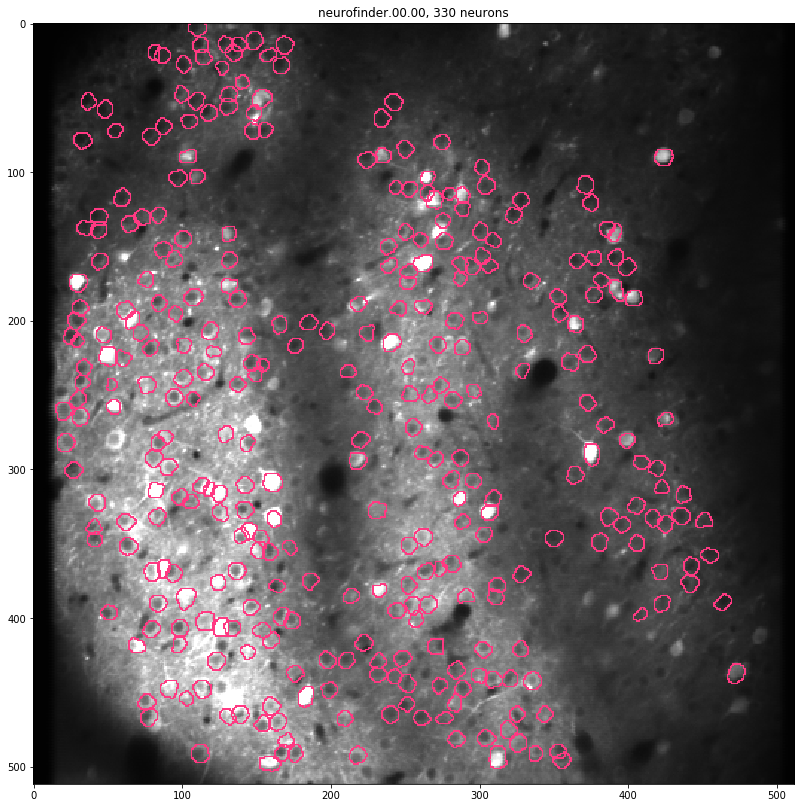

neurofinder.00.00.test


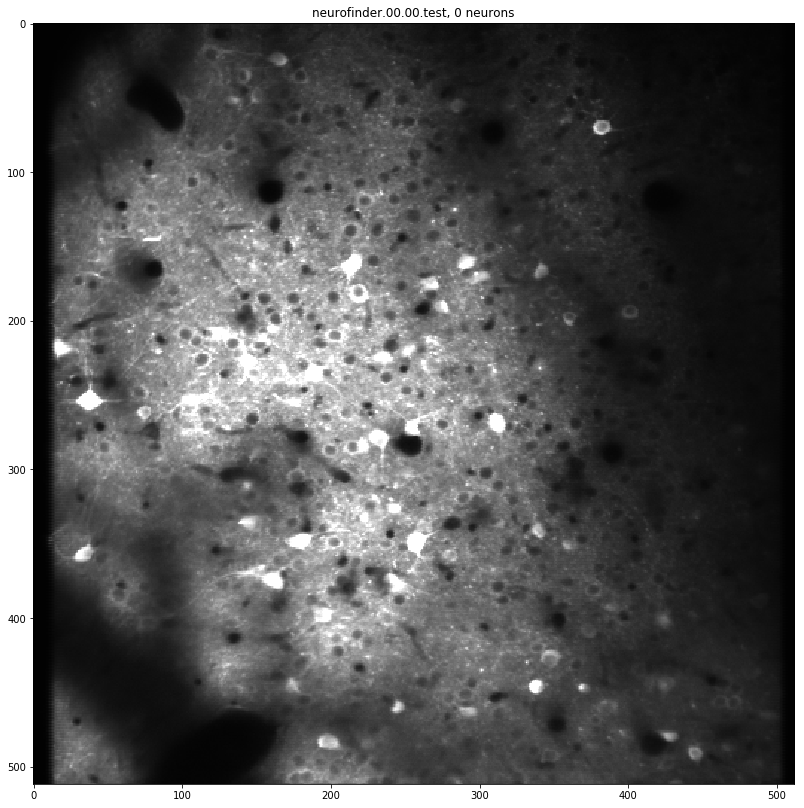

neurofinder.00.01


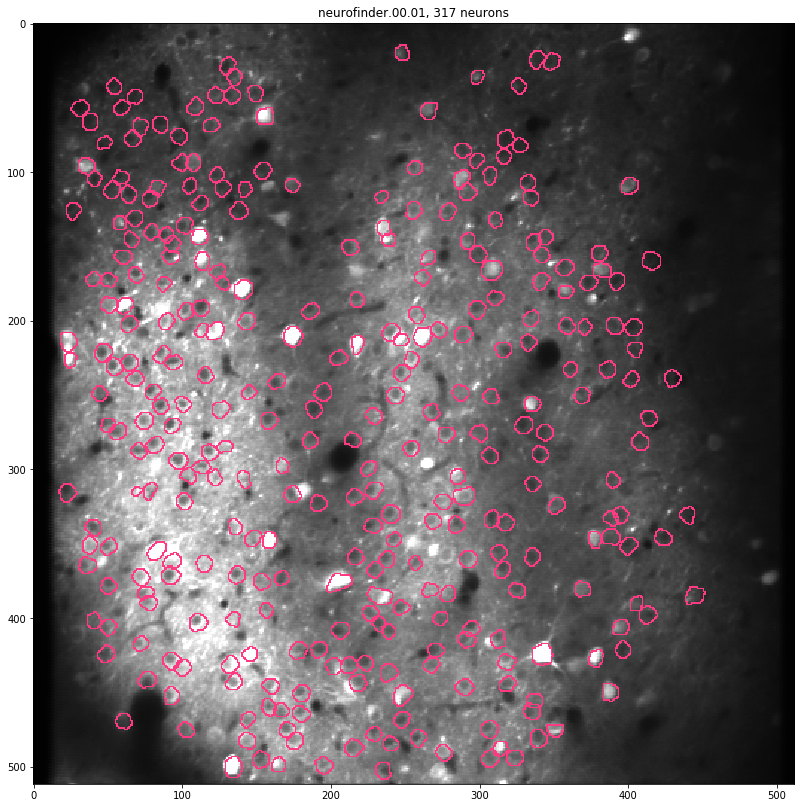

neurofinder.00.01.test


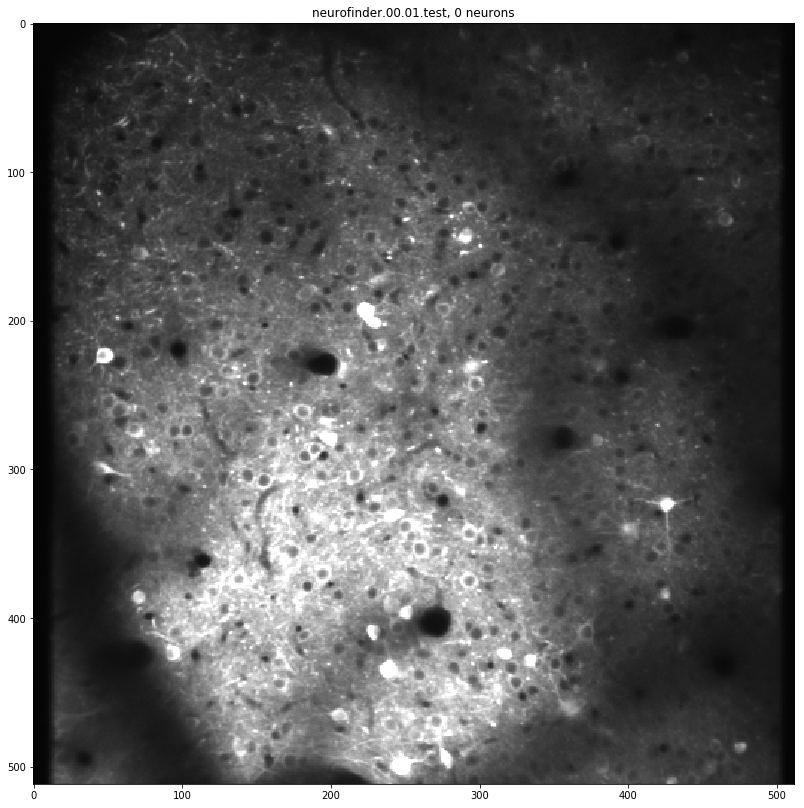

neurofinder.00.02


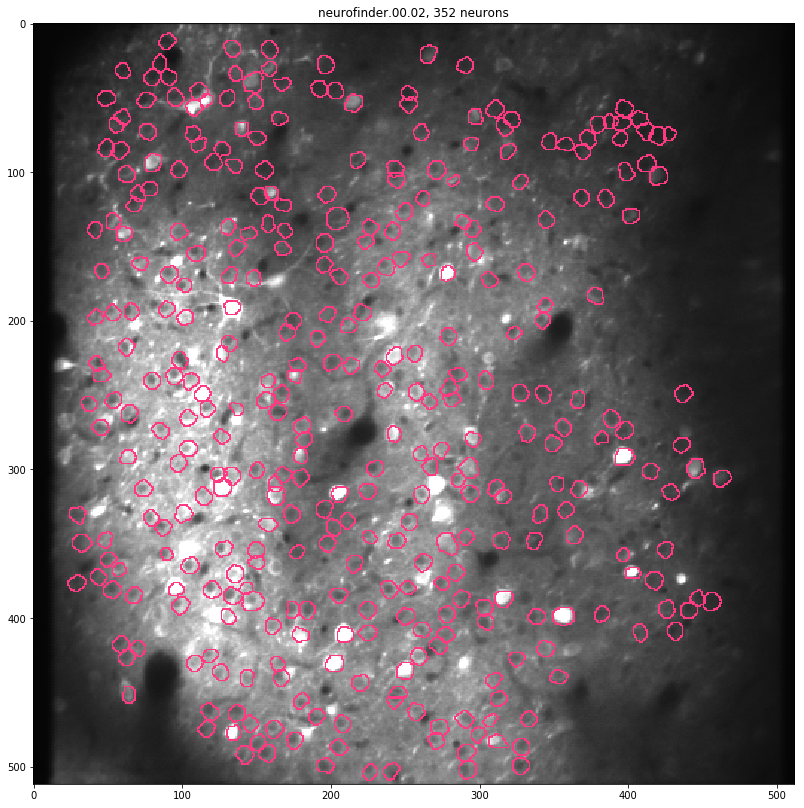

neurofinder.00.03


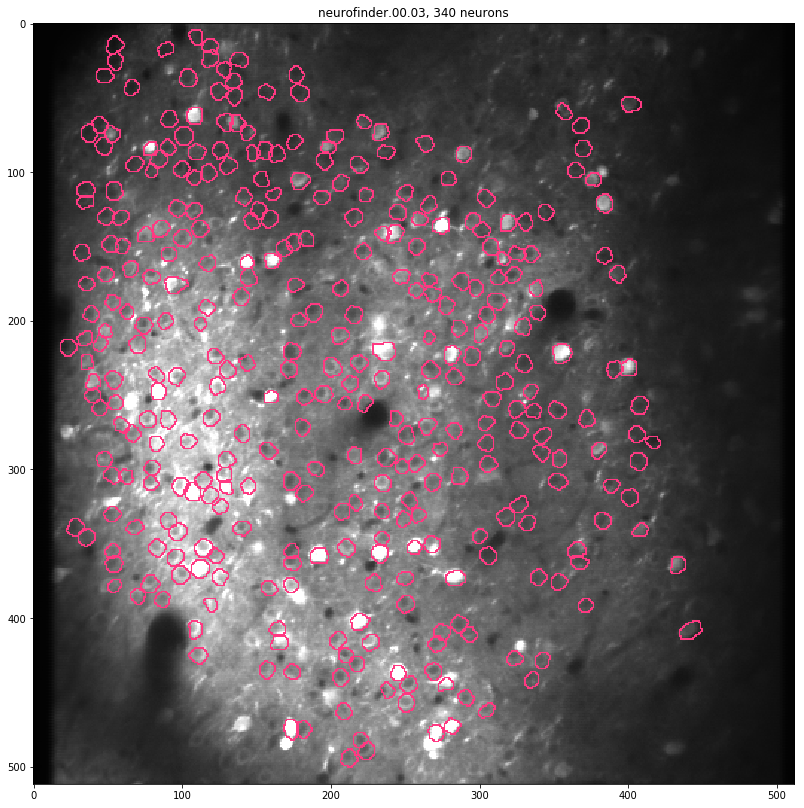

neurofinder.00.04


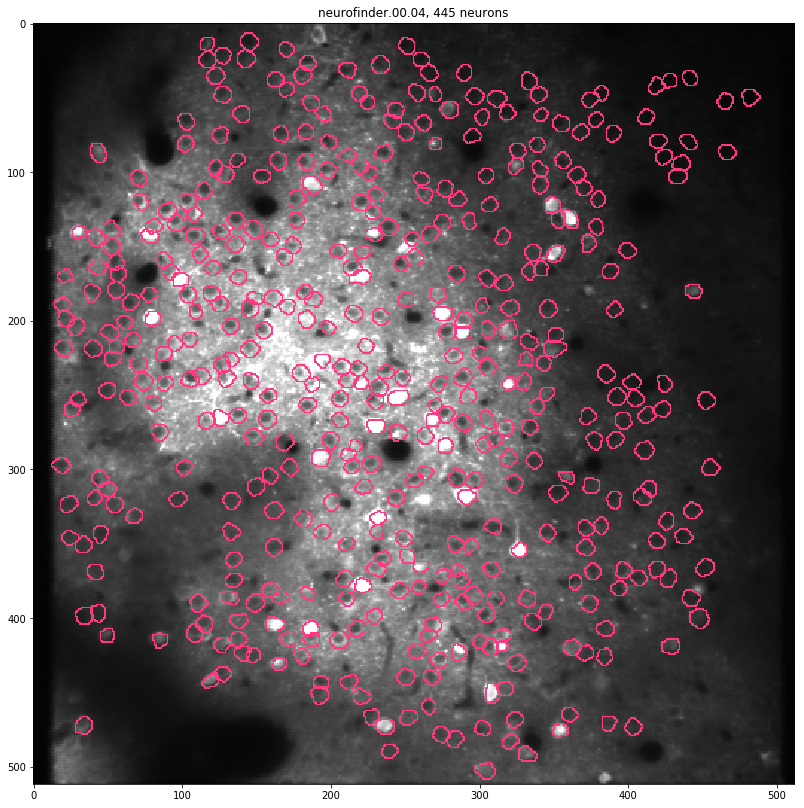

neurofinder.00.05


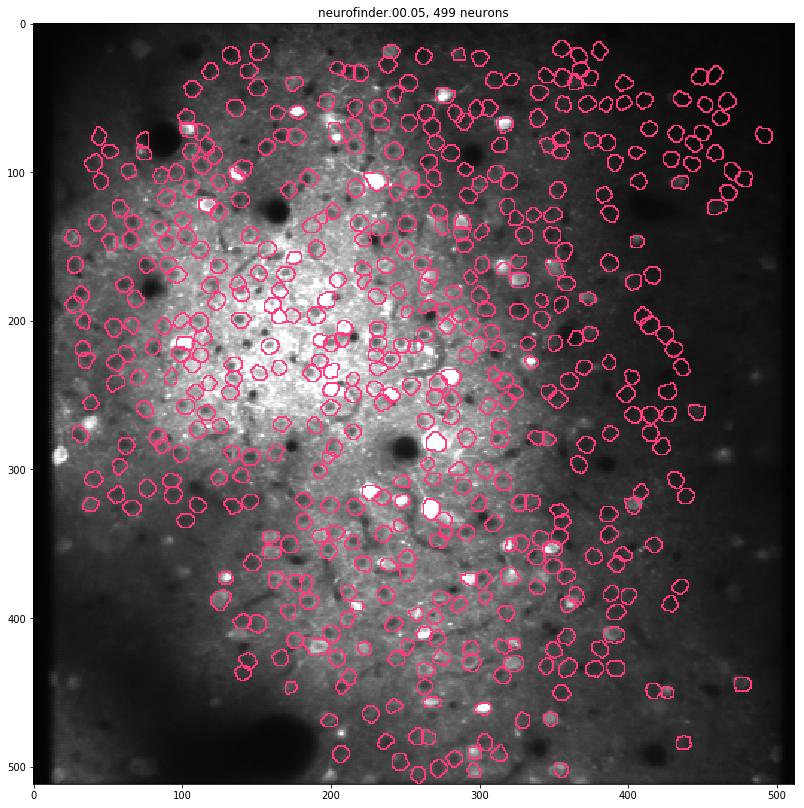

neurofinder.00.06


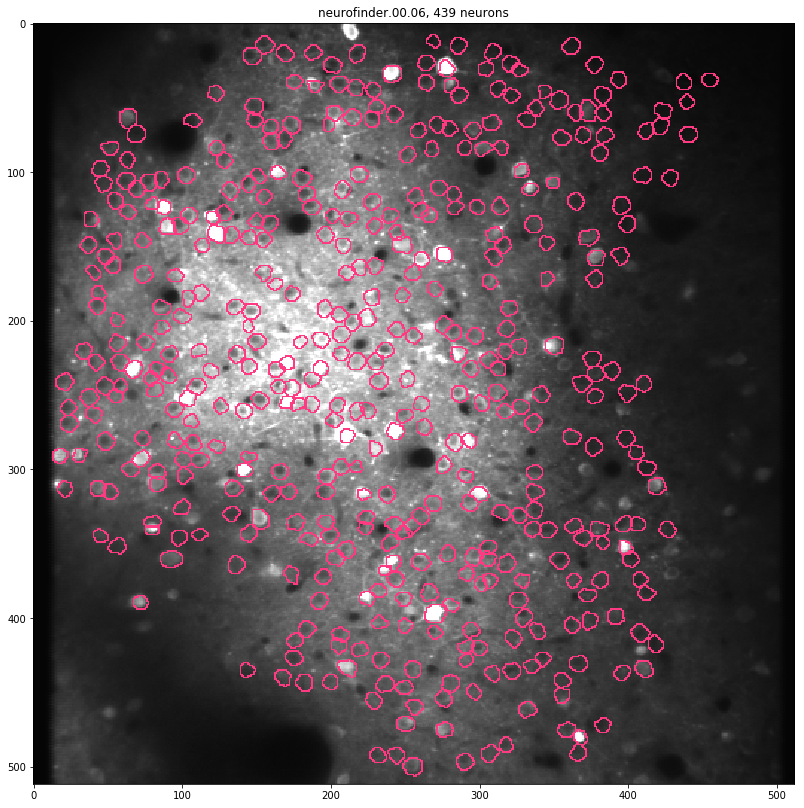

neurofinder.00.07


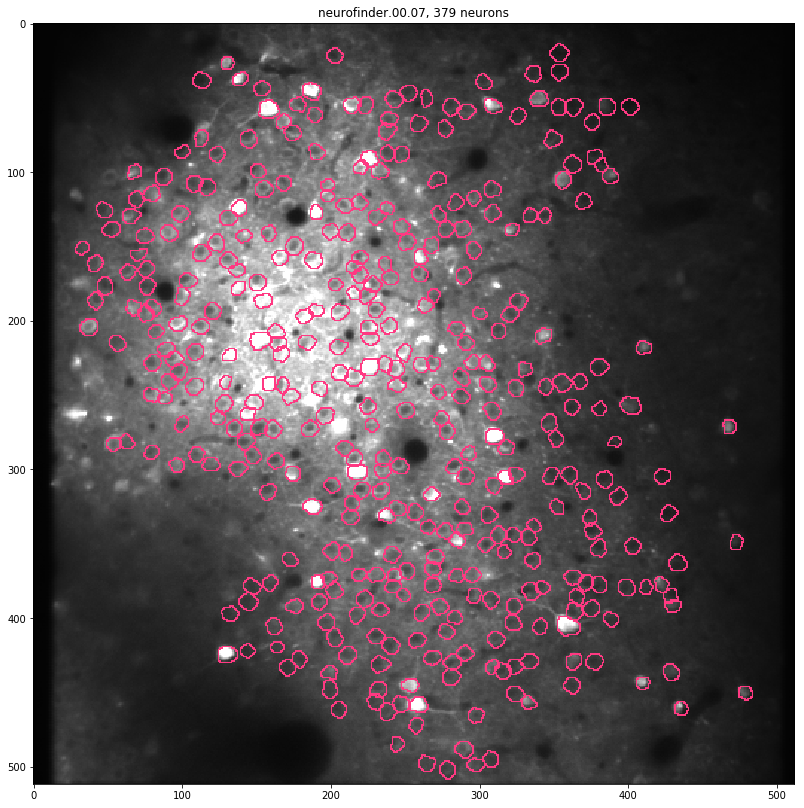

neurofinder.00.08


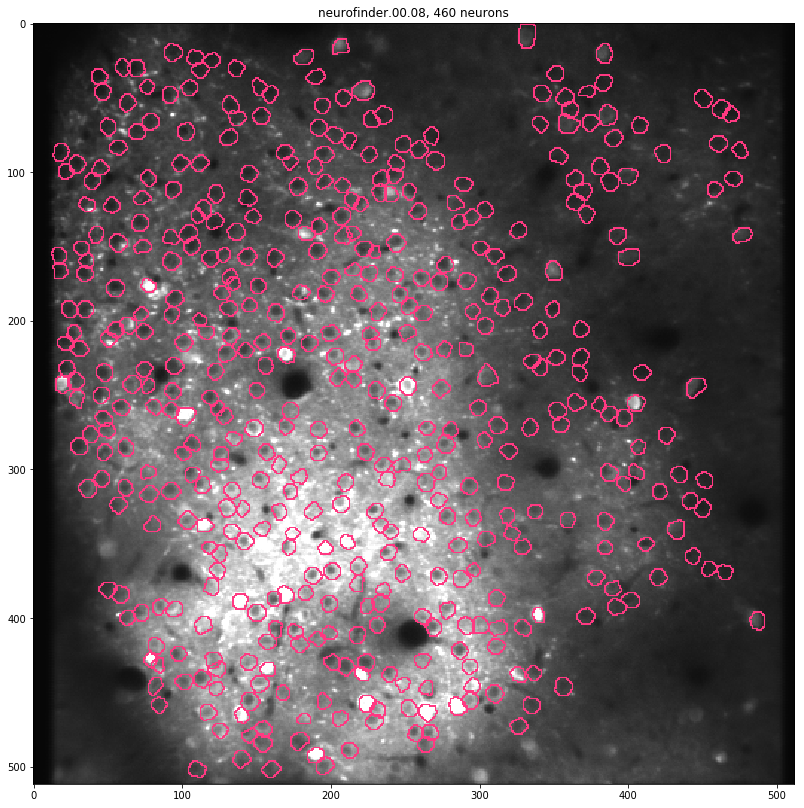

neurofinder.00.09


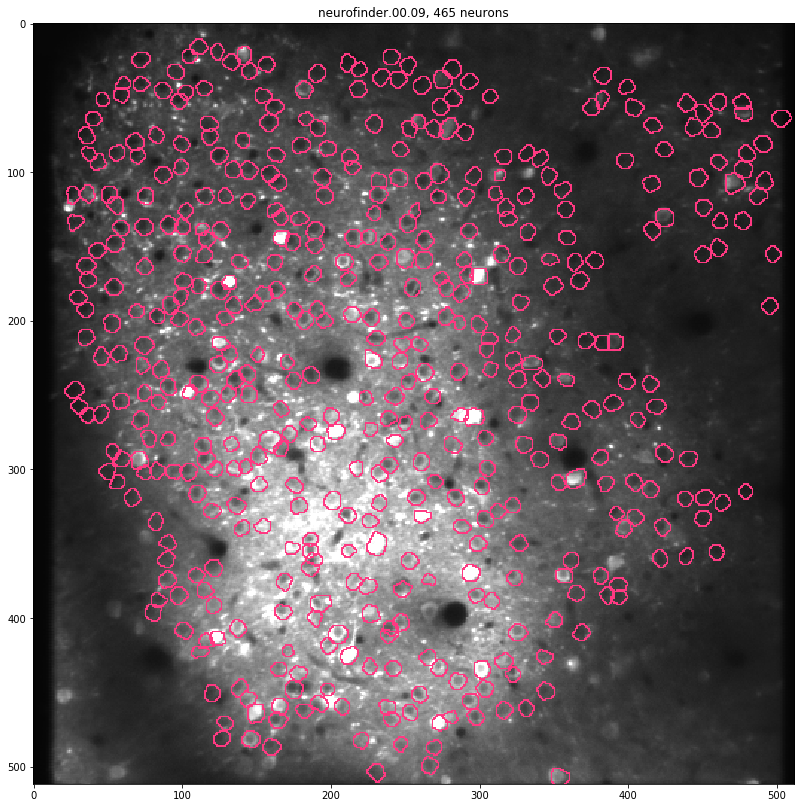

neurofinder.00.10


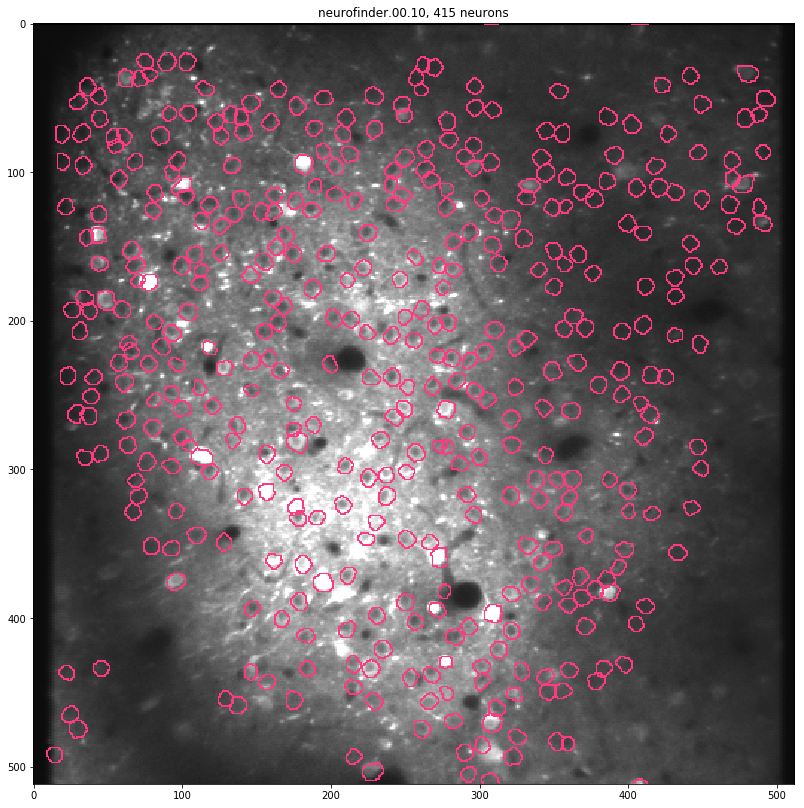

neurofinder.00.11


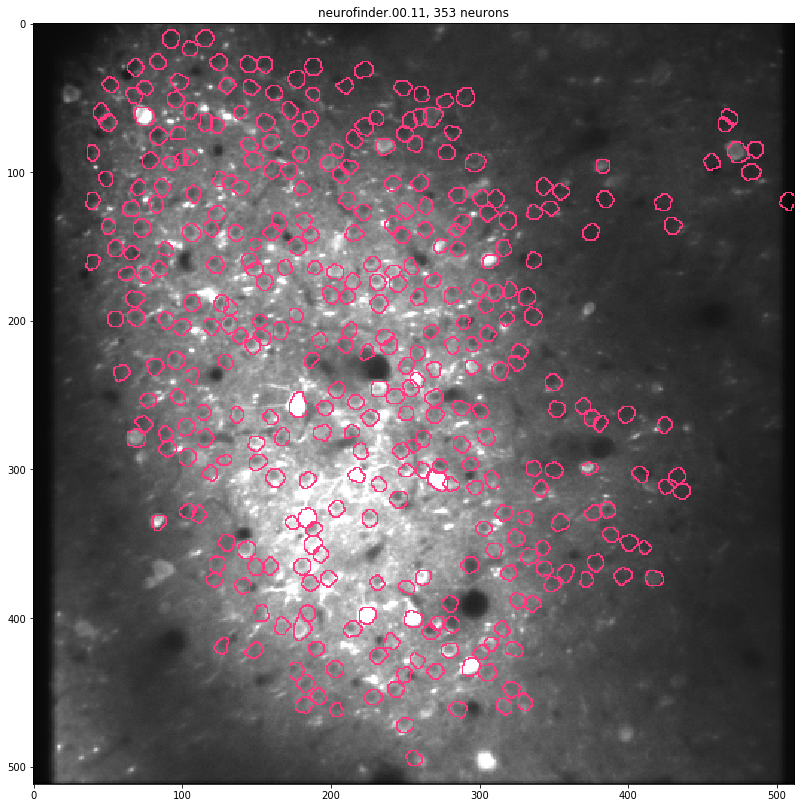

neurofinder.01.00


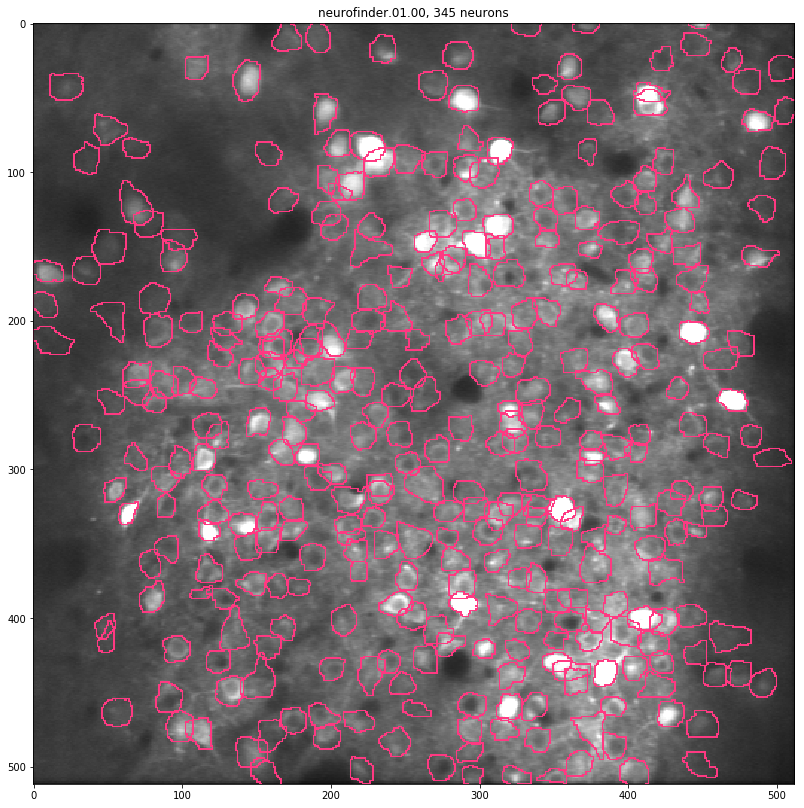

neurofinder.01.00.test


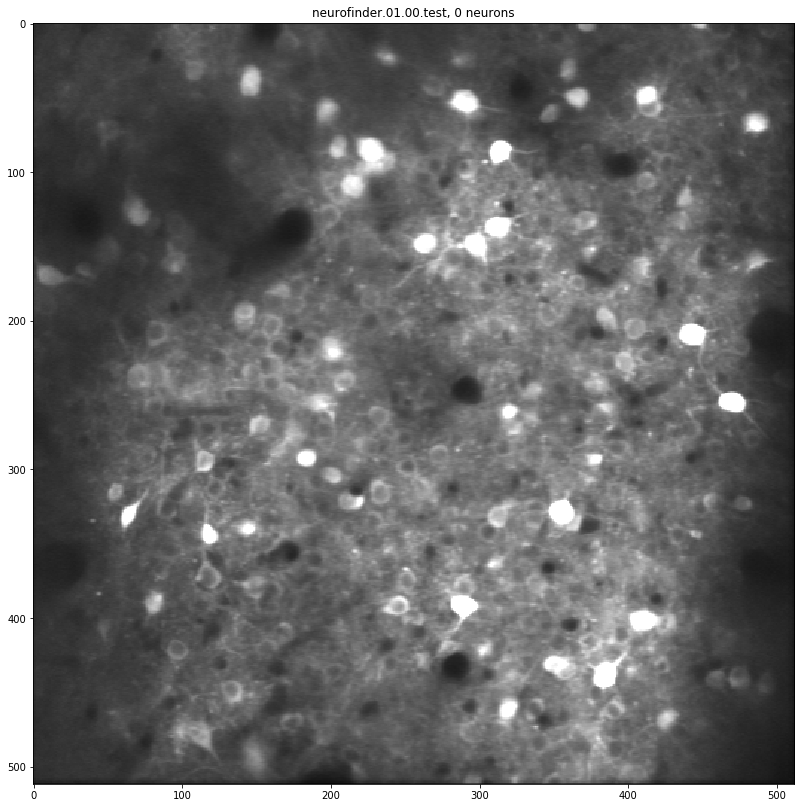

neurofinder.01.01


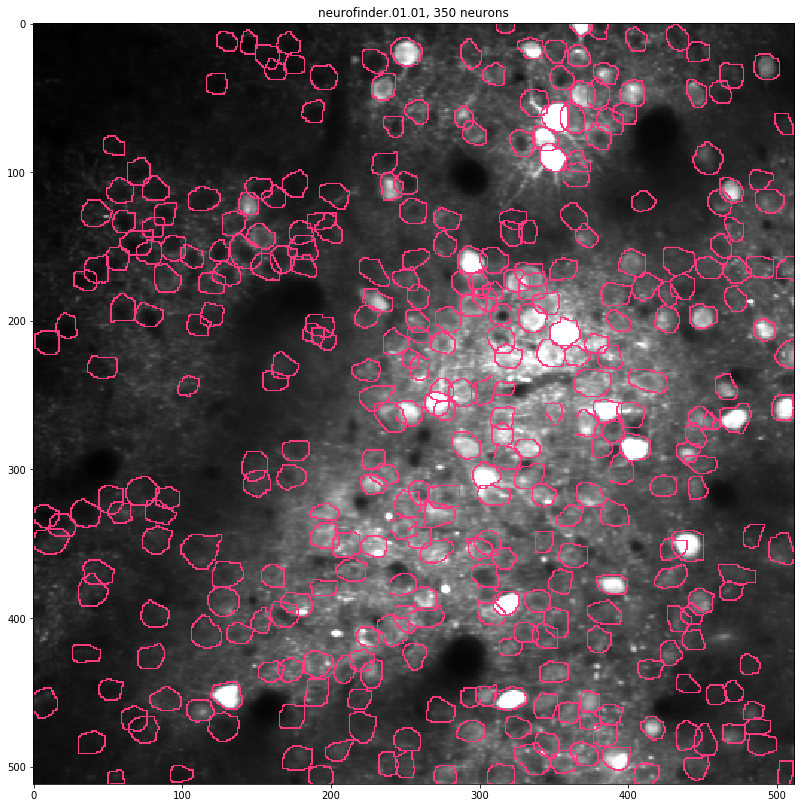

neurofinder.01.01.test


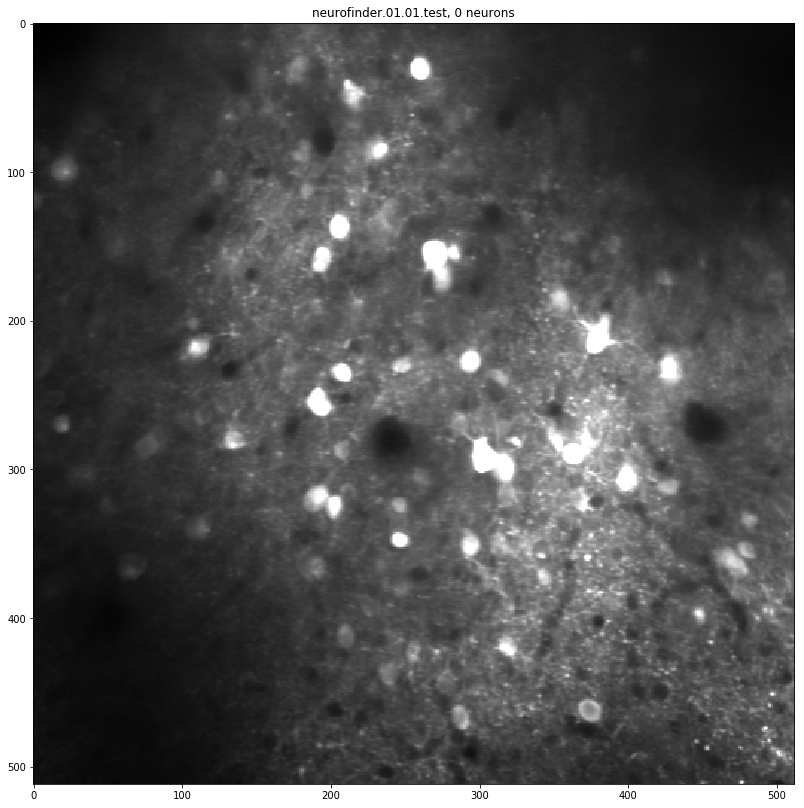

neurofinder.02.00


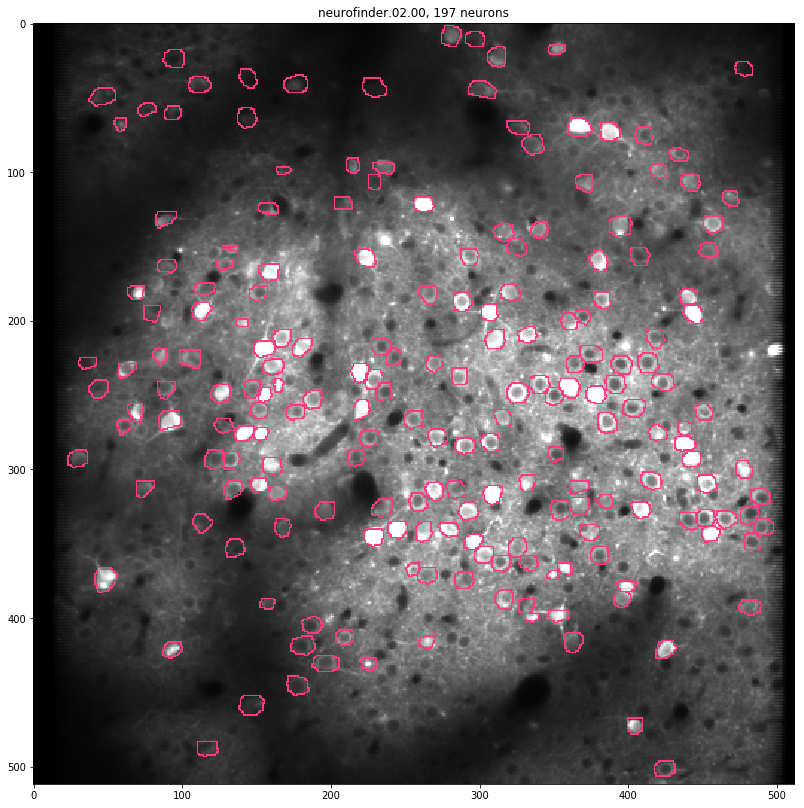

neurofinder.02.00.test


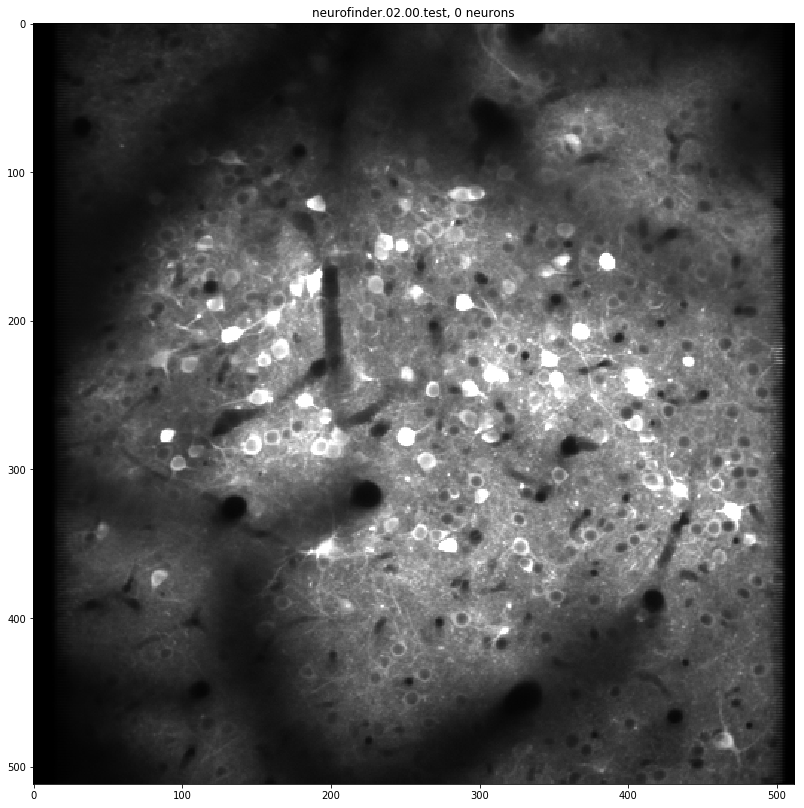

neurofinder.02.01


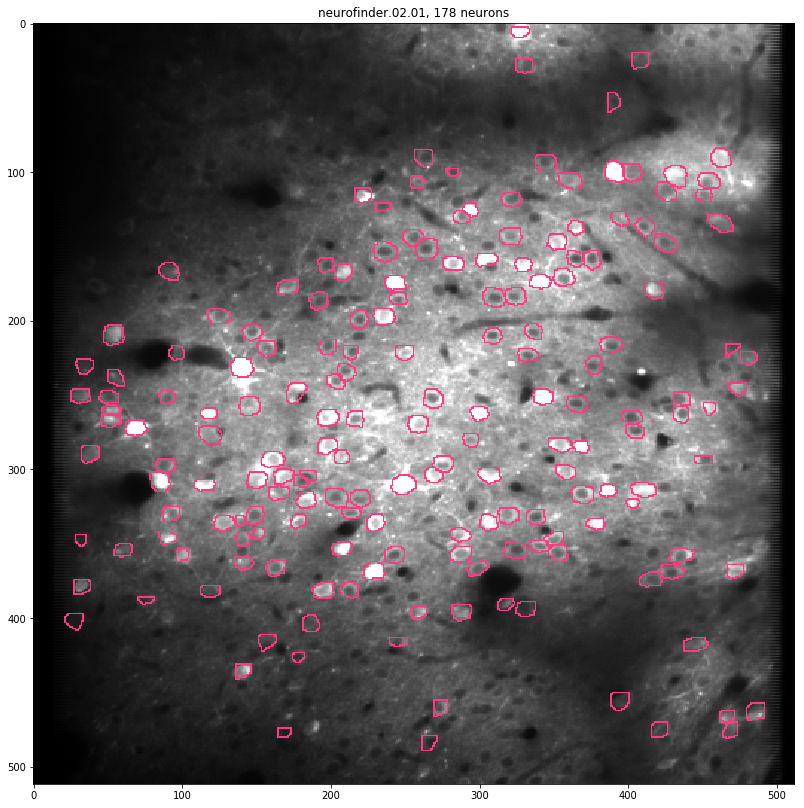

neurofinder.02.01.test


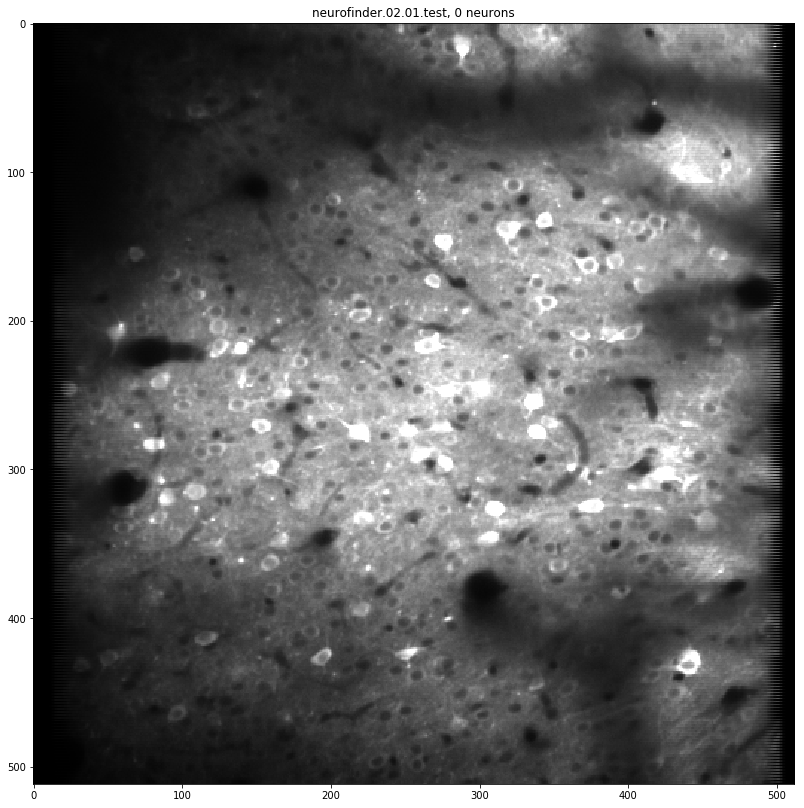

neurofinder.03.00


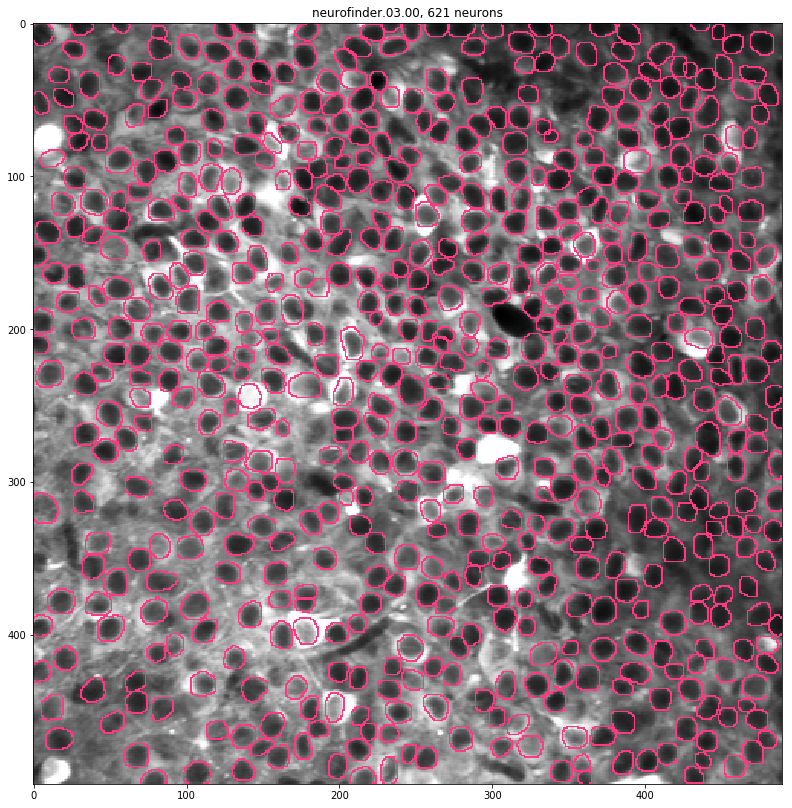

neurofinder.03.00.test


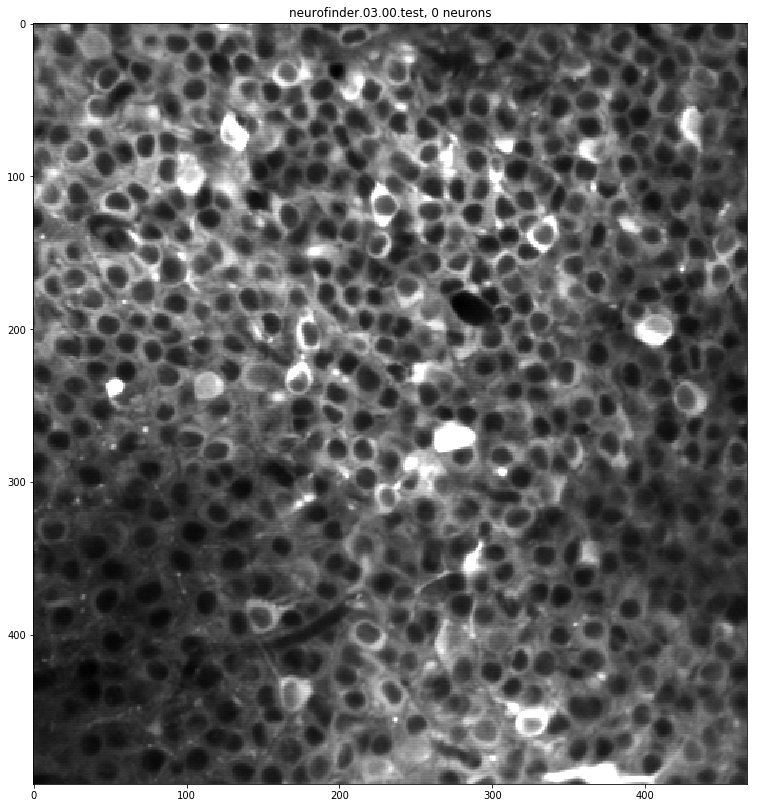

neurofinder.04.00


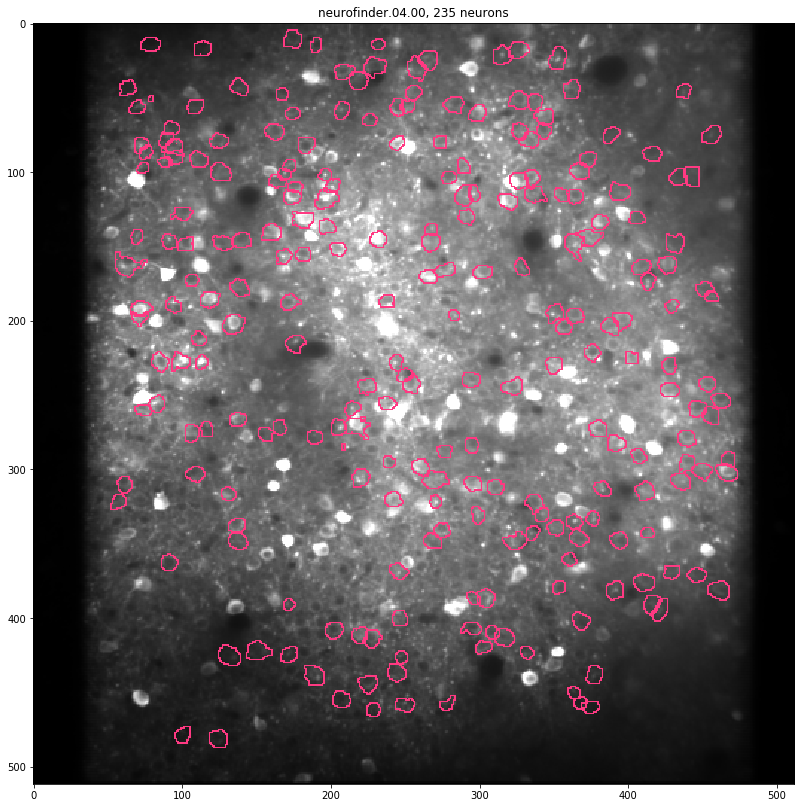

neurofinder.04.00.test


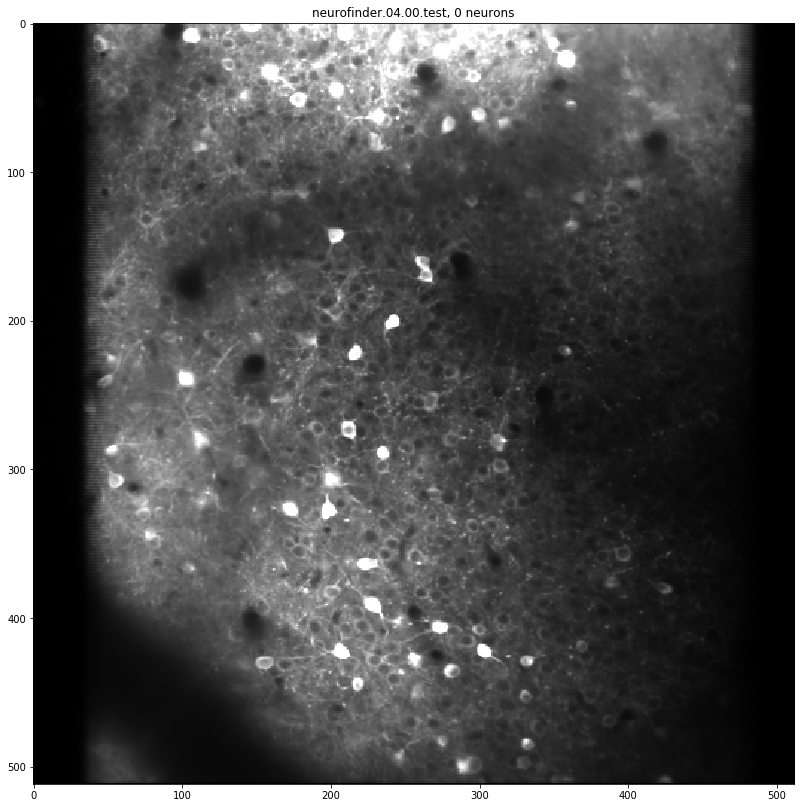

neurofinder.04.01


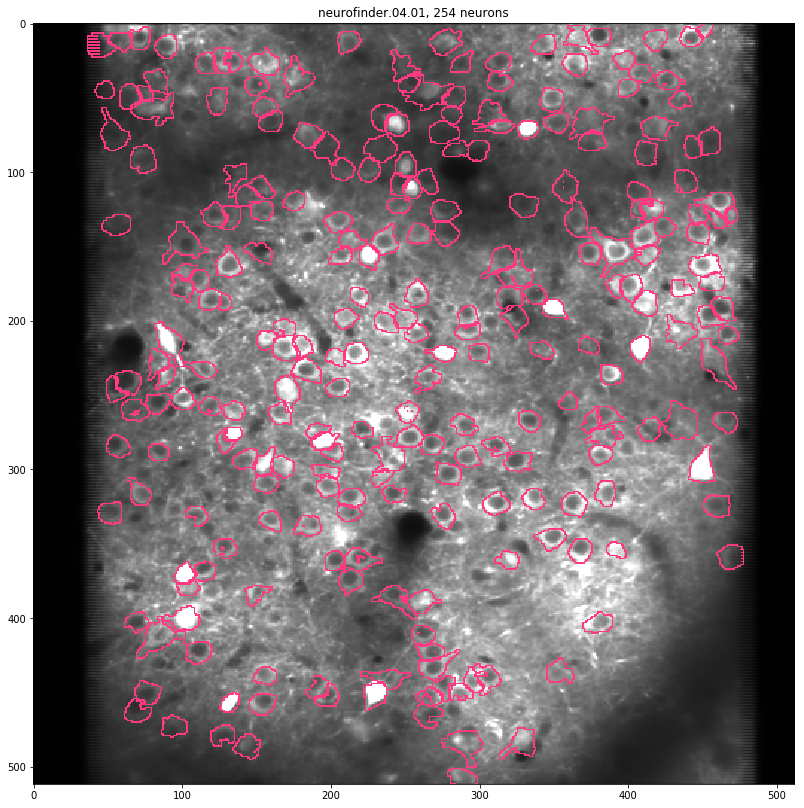

neurofinder.04.01.test


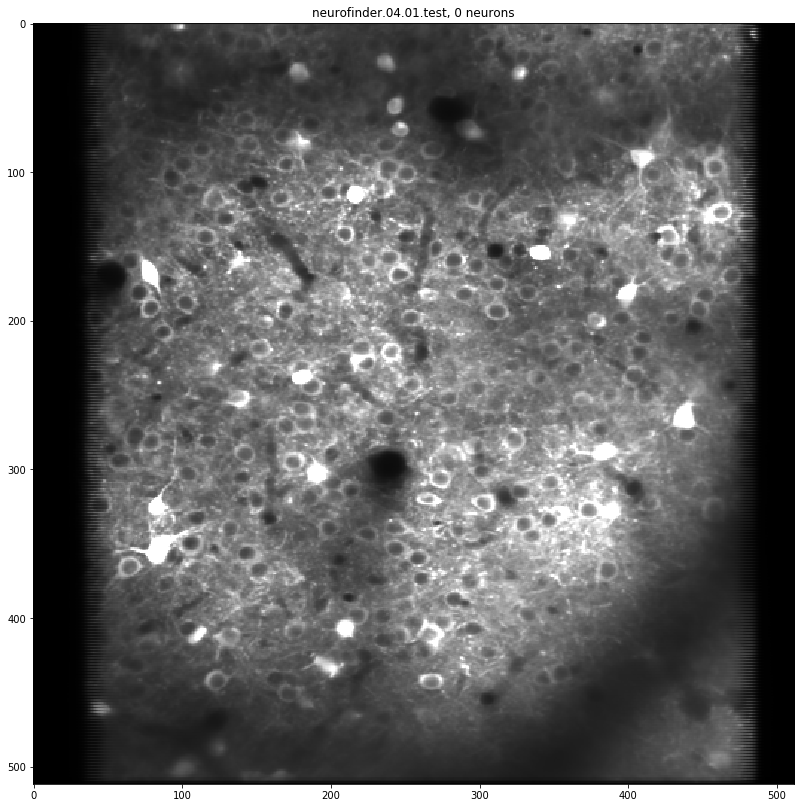

In [44]:
# Training set mean summaries with masks, testing without masks.
S, M = nf_load_hdf5('all', DATASETS_DIR)
for s, m in zip(S, M):
    print(s.attrs['name']) # ctrl-F friendly.
    plt.figure(figsize=(14,14))
    if 'm' in m:
        masks = m.get('m')[...]
        colors = [(141,32,72)] * len(masks)
    else:
        masks, colors = [], []
        
    outlined = mask_outlines(s.get('summary_mean')[...], masks, colors)
    plt.title('%s, %d neurons' % (s.attrs['name'], len(masks)))
    plt.imshow(outlined)
    plt.show()
    s.close(); m.close()